<a href="https://colab.research.google.com/github/mahmud-nobe/Physics_Simulation_Tutorial/blob/main/fluid_dynamics/lid_driven_cavity_flow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Breakout 2: Understanding Lid-driven Cavity Flow

In this breakout, we will primary focus on to understand the behaviour of a lid-driven cavity flow. 

Before start, let's run our CFD solver functions

In [1]:
import numpy as np
from matplotlib import pyplot as plt, cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
import sys

In [2]:
def diff_1st_x(f,dx):
  return (f[1:-1, 2:] - f[1:-1,0:-2])/(2*dx)

def diff_1st_y(f,dy):
  return (f[2:, 1:-1] - f[0:-2,1:-1])/(2*dy)

def diff_2nd_x(f,dx):
  return (
      # f(i-1,j) + 2*f(i,j) + f(i+1,j) 
      (f[1:-1,0:-2] - 2*f[1:-1,1:-1] + f[1:-1,2:])
      /dx**2
      ) 
  
def diff_2nd_y(f,dy):
  return (
      # f(i,j-1) + 2*f(i,j) + f(i,j+1) 
      (f[0:-2,1:-1] - 2*f[1:-1,1:-1] + f[2:,1:-1])
      /dy**2
      )

def laplacian(f, dx, dy):
  return (diff_2nd_x(f, dx) + 
          diff_2nd_y(f, dy))

In [3]:
def compute_vel_star(un, vn, dx, dy, dt):
  u_star = un.copy()
  v_star = vn.copy()

  # Equation (7), Owkes (2020)
  u_star[1:-1,1:-1] = (nu * laplacian(un, dx, dy) -
                         (un[1:-1, 1:-1]*diff_1st_x(un,dx) + 
                          vn[1:-1, 1:-1]*diff_1st_y(un,dy))
                      )*dt + un[1:-1, 1:-1]
                      
  # Equation (12), Owkes (2020)
  v_star[1:-1,1:-1] = (nu * laplacian(vn, dx, dy) -
                         (un[1:-1, 1:-1]*diff_1st_x(vn,dx) + 
                          vn[1:-1, 1:-1]*diff_1st_y(vn,dy))
                      )*dt + vn[1:-1, 1:-1]
  
  return u_star, v_star

In [4]:
def get_b(u_star, v_star, dx, dy, dt):
  '''
  Right hand side of equation (6), Owkes (2020)
  '''
  
  # (Divergence of vector-valued function)
  divergence_vel_star = (diff_1st_x(u_star,dx) + 
                         diff_1st_y(v_star,dy))
  # b[1:-1,1:-1] = (1*rho/dt) * divergence_vel_star
  b = (rho/dt) * divergence_vel_star

  return b

In [5]:
def pressure_poisson(p, b, dx, dy):  
  pn = p.copy()

  # (pn(i-1,j) + pn(i+1,j)) * dy**2 
  term1 = (pn[1:-1,0:-2] + pn[1:-1,2:]) * dy**2
  # (pn(i,j-1) + pn(i,j+1)) * dx**2
  term2 = (pn[0:-2,1:-1] + pn[2:,1:-1]) * dx**2
  # term 3 is -b * dx^2  * dy^2
  term3 = -(b * (dx**2 * dy**2))

  p[1:-1,1:-1] = (
      (term1 + term2 + term3)
      / (2*(dx**2+dy**2))
  )

  p = set_pressure_boundary(p)

  return p

In [6]:
def corrector_step(u_star, v_star, p, dx, dy, dt, rho, u_lid):
  u = np.empty_like(u_star)
  v = np.empty_like(u_star)

  u[1:-1,1:-1] = (-dt/rho)*(diff_1st_x(p, dx)) + u_star[1:-1,1:-1]
  v[1:-1,1:-1] = (-dt/rho)*(diff_1st_y(p, dy)) + v_star[1:-1,1:-1]

  u, v = set_velocity_boundary(u, v, u_lid)

  return u, v

In [7]:
def simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid):
  for n in range(nt):
    un = u.copy()
    vn = v.copy()

    # Predictor step (starred velocities)
    u_star, v_star = compute_vel_star(un, vn, dx, dy, dt)

    # Solve pressure Poisson Equation
    b = get_b(u_star, v_star, dx, dy, dt)
    p = pressure_poisson(p, b, dx, dy)

    # Corrector step (update velocities)
    u, v = corrector_step(u_star, v_star, p, dx, dy, dt, rho, u_lid)

  return u, v, p

In [8]:
# setup

nx = 41
x_max = 2 
x_min = 0

ny = 41
y_max = 2
y_min = 0

nt = 500
dx = (x_max - x_min) / (nx - 1)
dy = (y_max - y_min) / (ny - 1)

x = np.linspace(x_min, x_max, nx)
y = np.linspace(y_min, x_max, ny)
X, Y = np.meshgrid(x,y)

# Lid-Driven Cavity Test



This is a setup where we have fluid in 2d and all boundaries are fixed except the top boundary (i.e. the lid), that has a constant u-velocity = 2 (for our case). Consequently, we have a fixed boundary condition for pressure in top layer and Neumann boundary condition all other boundaries. The velocity of the top lid drives fluid motion in the 2D space. 

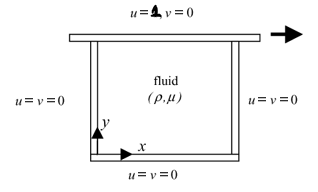

## a) 
**Why the pressure has a Neumann boundary condition in other boundaries and fixed boundary condition in lid?**

[Think how pressure and fluid flow are related?]

In [9]:
def set_velocity_boundary(u,v, u_lid):
    # Velocidty boundary conditions (Dirichlet or "fixed")
    u[0, :]  = 0
    u[:, 0]  = 0
    u[:, -1] = 0
    u[-1, :] = u_lid   # set velocity on cavity lid
    v[0, :]  = 0
    v[-1, :] = 0
    v[:, 0]  = 0
    v[:, -1] = 0

    return u, v

In [10]:
def set_pressure_boundary(p):
    # Pressure boundary conditions (Neumann or "second-type")
    p[:, -1] = p[:, -2] # dp/dx = 0 at x = 2
    p[0, :] = p[1, :]   # dp/dy = 0 at y = 0
    p[:, 0] = p[:, 1]   # dp/dx = 0 at x = 0
    # Pressure boundary conditions (Dirichlet or "fixed")
    p[-1, :] = 0        # p = 0 at y = 2

    return p

In [11]:
# initial condition

rho = 1 # density
nu = .1 # kinetic viscosity = viscosity/density
dt = .001 # timestep
u_lid = 1

Now let's check how the system behaves over time:

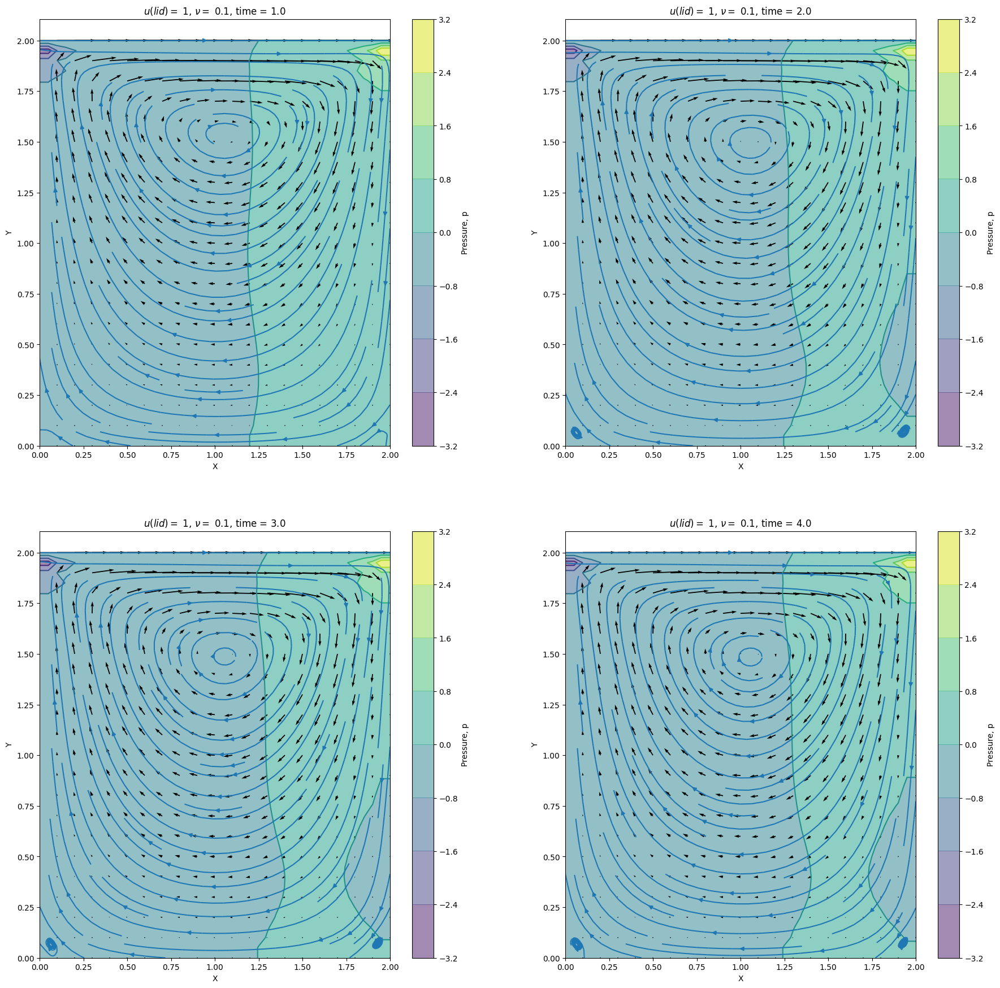

In [12]:
u = np.zeros((ny, nx))
v = np.zeros((ny, nx))
p = np.zeros((ny, nx))

fig = plt.figure(figsize=(22,22), dpi=100)

total_time = 4000

for i in range(4):
    nt = int(total_time/4)
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    # plotting the Pressure as a contour
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Pressure, p')
    # plotting the Pressure velocity outlines
    plt.contour(X, Y, p, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt*(i+1)}')
plt.show()

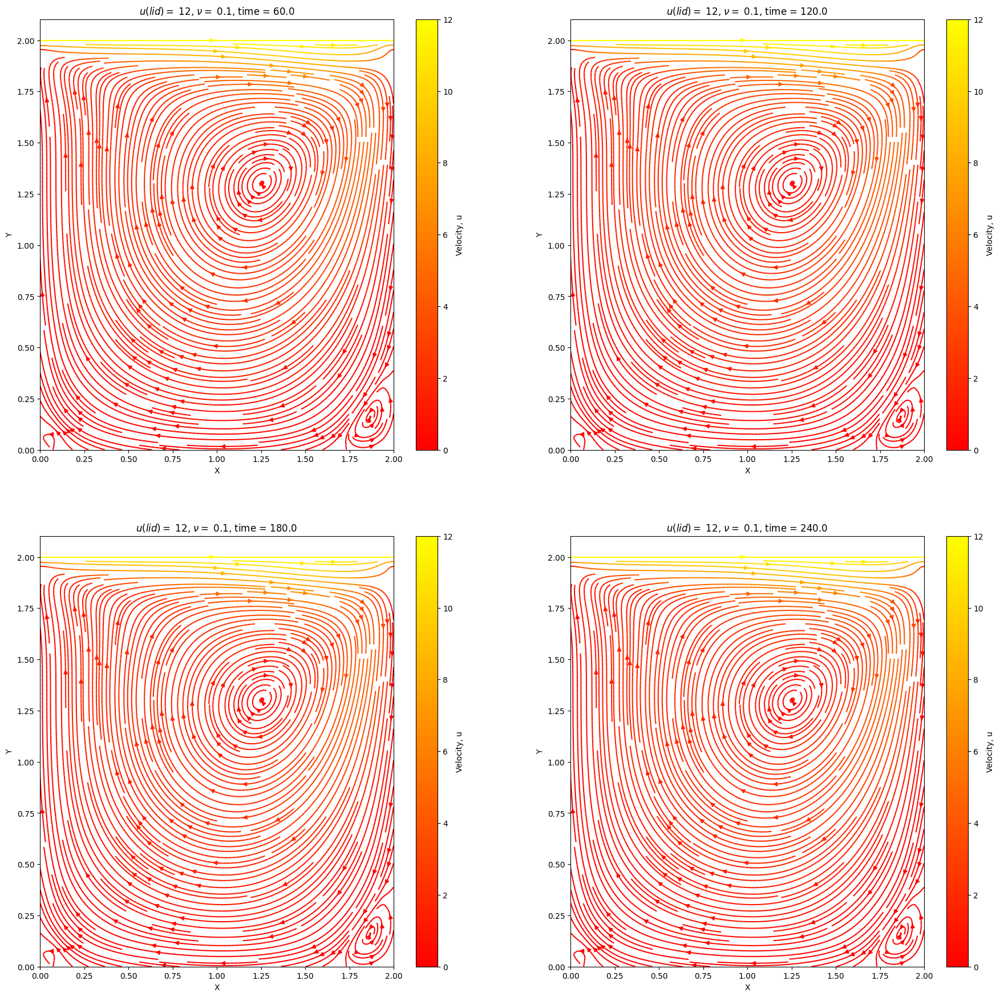

In [27]:
u = np.zeros((ny, nx))
v = np.zeros((ny, nx))
p = np.zeros((ny, nx))

u_lid = 12
nu = 0.1
dt = 0.005

fig = plt.figure(figsize=(22,22), dpi=100)

total_time = 48000

for i in range(4):
    nt = int(total_time/4)
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    velocity = np.sqrt(u**2 + v**2)
    plt.subplot(2,2,i+1)
    # plotting the horizontal velocity as a contour
    #plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    #plt.colorbar(label = 'Horizontal Velocity, u')
    # plotting the horizontal velocity outlines
    #plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v, 3, color = velocity, cmap=cm.autumn) 
    #plt.contourf(X, Y, velocity, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Velocity, u') 

    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt*(i+1)}')
plt.show()

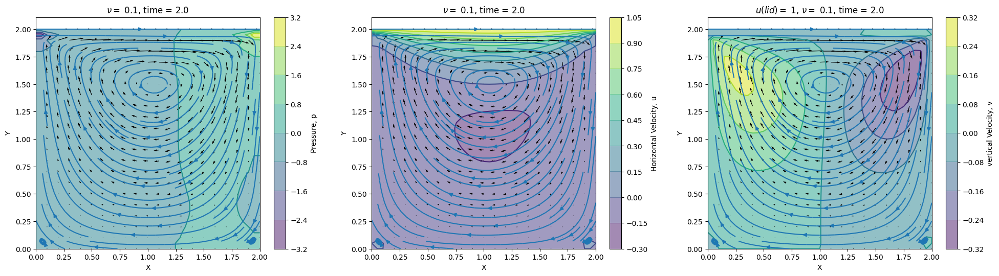

In [20]:
nu = .1
u = np.zeros((ny, nx))
v = np.zeros((ny, nx))
p = np.zeros((ny, nx))

fig = plt.figure(figsize=(24,6), dpi=100)

nt = 2000
u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

plt.subplot(1,3,1)
plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
plt.colorbar(label = 'Pressure, p')
plt.contour(X, Y, p, cmap=cm.viridis)
plt.streamplot(X, Y, u, v)  
plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
plt.xlabel('X')
plt.ylabel('Y');
plt.title(f'$\\nu =$ {nu}, time = {nt*dt}')

plt.subplot(1,3,2)
plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
plt.colorbar(label = 'Horizontal Velocity, u')
plt.contour(X, Y, u, cmap=cm.viridis)
plt.streamplot(X, Y, u, v)  
plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
plt.xlabel('X')
plt.ylabel('Y');
plt.title(f'$\\nu =$ {nu}, time = {nt*dt}')

plt.subplot(1,3,3)
plt.contourf(X, Y, v, alpha=0.5, cmap=cm.viridis)
plt.colorbar(label = 'vertical Velocity, v')
plt.contour(X, Y, v, cmap=cm.viridis)
plt.streamplot(X, Y, u, v)  
plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
plt.xlabel('X')
plt.ylabel('Y');
plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()

## b) 
**How the system behaves as understood from the quiver and streamplot? Discuss why we have a two different pressure regions and some extra pressure regions in the corners? How do they help flowing the fluid?**
 
**Also interpret the regions in the u and v contour plot.** 

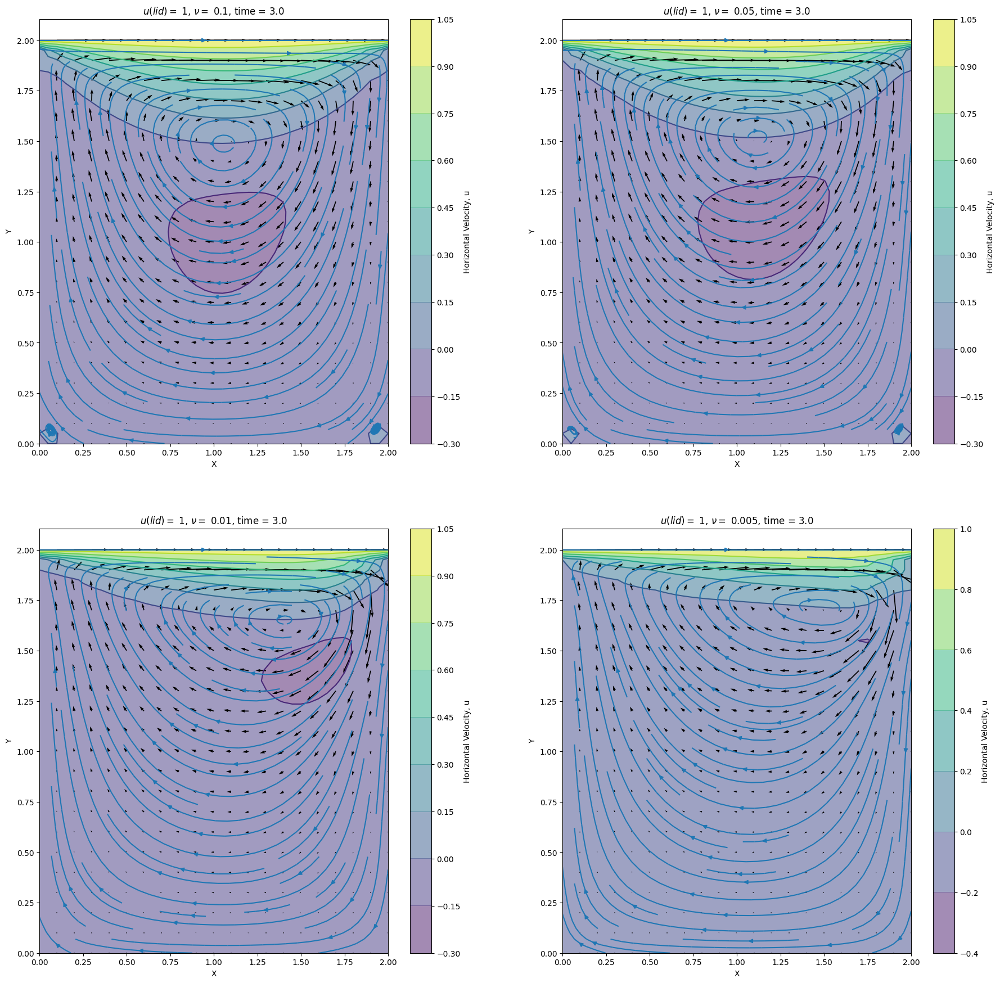

In [22]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [1e-1, 0.5e-1, 1e-2, 0.5e-2] # add your value here
dt = .001
u_lid = 1

for i in range(len(nus)):
    nu = nus[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000

    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Horizontal Velocity, u')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()

## c) lid velocity

So far, we considered a 

In [42]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [0, 0.5e-1, 1e-2, 0.5e-2]
dt = .001
u_lids = [2, 4, 6, 8]

for i in range(len(u_lids)):
    u_lid = 2
    nu = nus[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000
    u[-1, :] = u_lid

    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Horizontal Velocity, u')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, Re = {u_lid*2/nu}, time = {nt*dt}')
plt.show()

TypeError: ignored

<Figure size 2200x2200 with 0 Axes>

In [ ]:
def set_velocity_boundary(u,v, u_lid):
    # Velocidty boundary conditions (Dirichlet or "fixed")
    u[0, :]  = 0
    u[:, 0]  = 0
    u[:, -1] = 0
    u[-1, :] = u_lid  # set velocity on cavity lid
    v[0, :]  = 0
    v[-1, :] = 0
    v[:, 0]  = 0
    v[:, -1] = 0

    return u, v

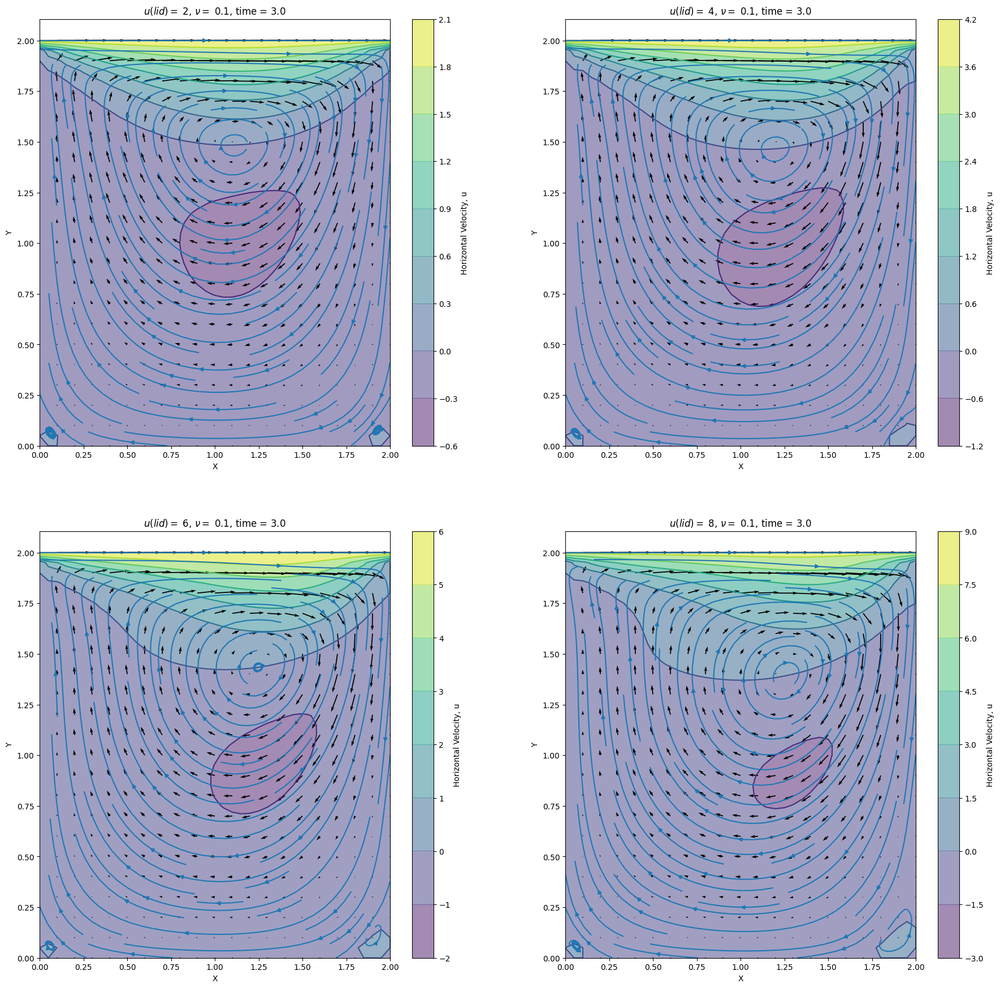

In [23]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [0.5e-1, 1e-1, 1e-2, 0.5e-3]
dt = .001
u_lids = [2, 4, 6, 8]



for i in range(len(u_lids)):
    nu = 0.1
    u_lid = u_lids[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000
    u[-1, :] = u_lid
    #u[0, :] = -u_lid
    #v[:, -1] = u_lid
    #v[:, 0] = -u_lid
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Horizontal Velocity, u')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()

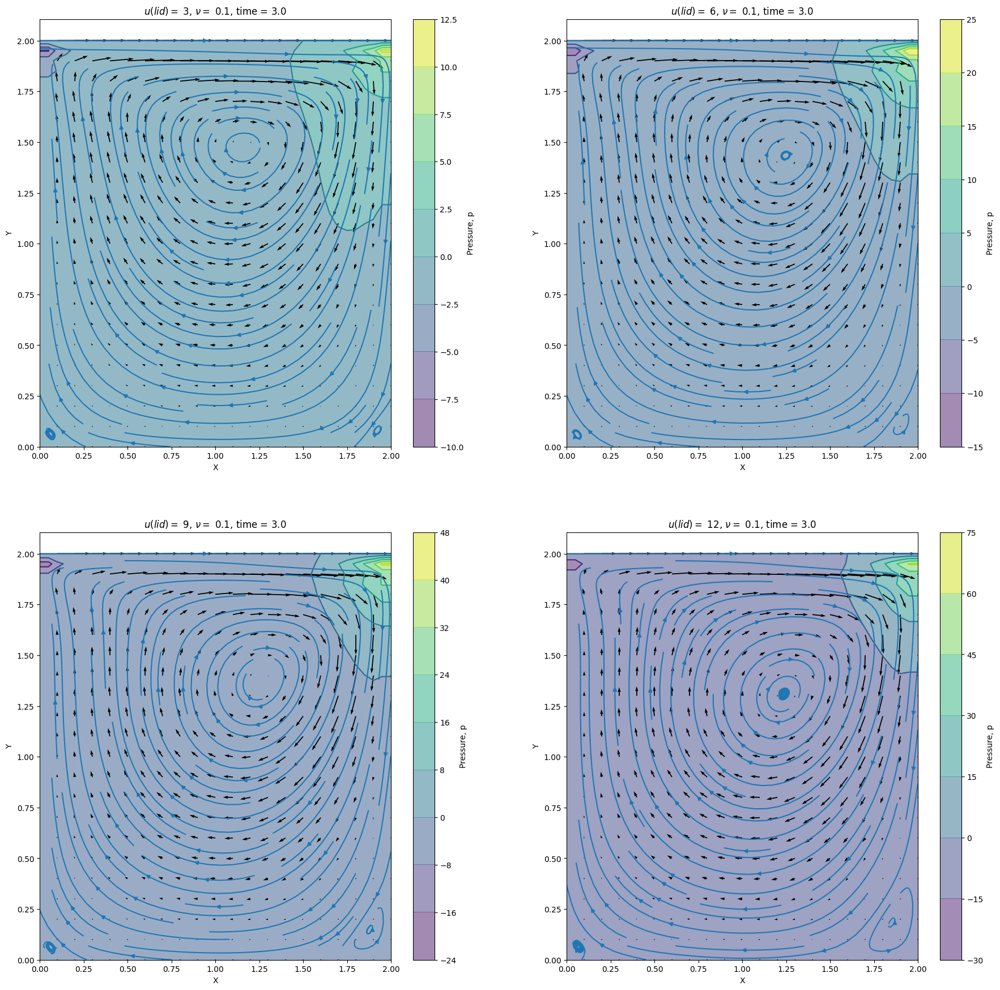

In [37]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [0.5e-1, 1e-1, 1e-2, 0.5e-3]
dt = .001
u_lids = [3, 6, 9, 12]



for i in range(len(u_lids)):
    nu = 0.1
    u_lid = u_lids[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000
    u[-1, :] = u_lid
    #u[0, :] = -u_lid
    #v[:, -1] = u_lid
    #v[:, 0] = -u_lid
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Pressure, p')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, p, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()

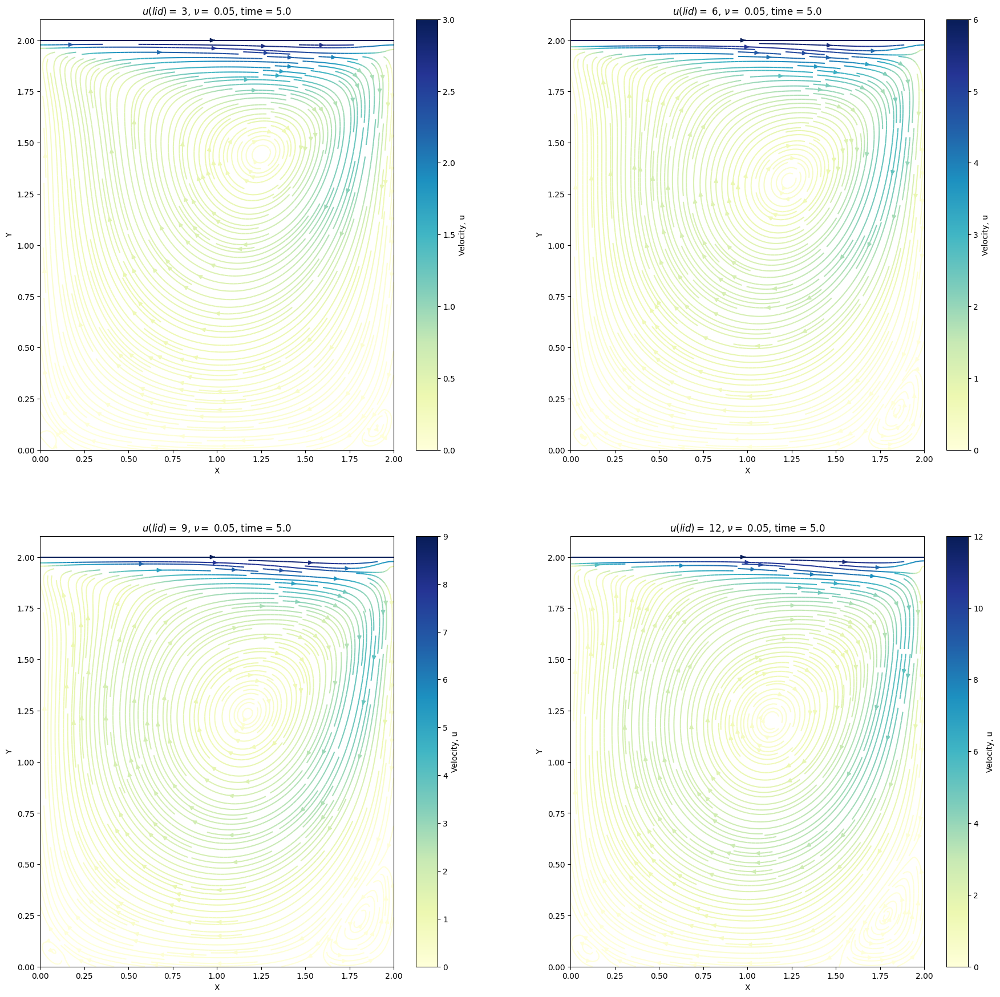

In [19]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [0.5e-1, 1e-1, 1e-2, 0.5e-3]
dt = .001
u_lids = [3, 6, 9, 12]



for i in range(len(u_lids)):
    nu = 0.05
    u_lid = u_lids[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 5000
    u[-1, :] = u_lid
    #u[0, :] = -u_lid
    #v[:, -1] = u_lid
    #v[:, 0] = -u_lid
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    velocity = np.sqrt(u**2 + v**2)
    # plotting the horizontal velocity as a contour
    #plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    #plt.colorbar(label = 'Horizontal Velocity, u')
    # plotting the horizontal velocity outlines
    #plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v, 3, color = velocity, cmap=cm.YlGnBu) 
    #plt.contourf(X, Y, velocity, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Velocity, u') 

    # plotting velocity field
    #plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: overflow encountered in multiply
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: overflow encountered in multiply
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in add
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: overflow encountered in multiply
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: overflow encountered in multiply
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in add
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in subtract
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in subtract
  """
/usr/local/lib/python3.7/dist-p

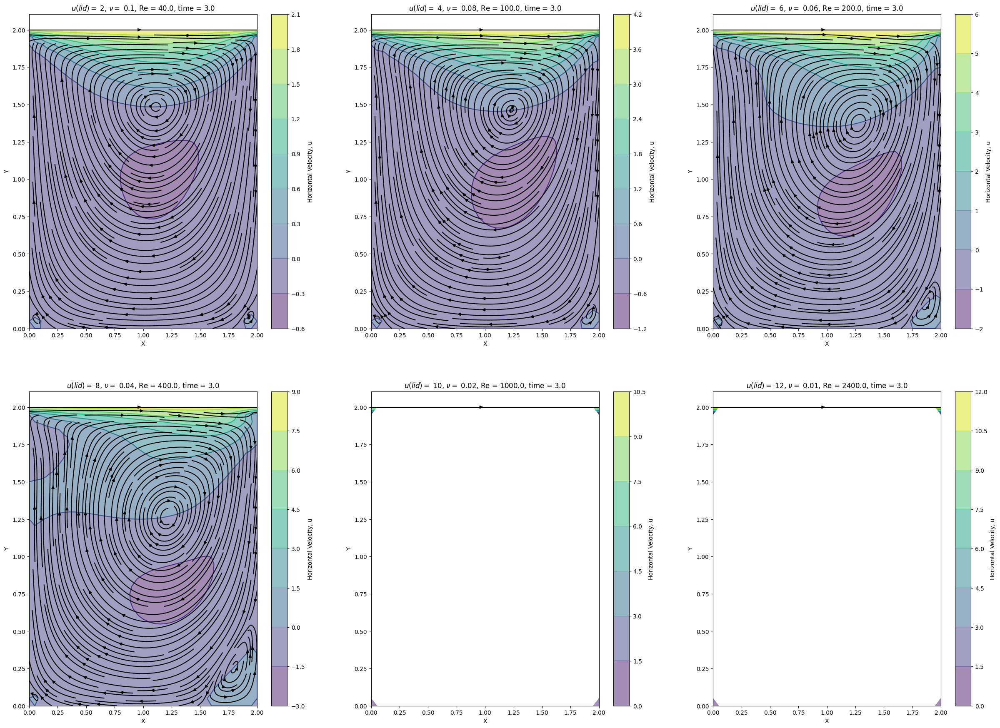

In [41]:
fig = plt.figure(figsize=(30,22), dpi=100)

nus = [0.1, 0.08, 0.06, 0.04, 0.02, 0.01]
dt = .001
u_lids = [2,4,6,8,10,12]



for i in range(len(u_lids)):
    nu = nus[i]
    u_lid = u_lids[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000
    u[-1, :] = u_lid
    #u[0, :] = -u_lid
    #v[:, -1] = u_lid
    #v[:, 0] = -u_lid
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,3,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Horizontal Velocity, u')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v, 2 , color='black')  
    # plotting velocity field
    #plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, Re = {u_lid*2/nu}, time = {nt*dt}')
plt.show()

In [ ]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [1e-1, 0.5e-1, 1e-2, 0.5e-2]
dt = .001
u_lids = [2, 4, 6, 8]



for i in range(len(u_lids)):
    u_lid = u_lids[0]
    nu = nus[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 2000
    u[-1, :] = u_lid

    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Horizontal Velocity, u')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, Re = {u_lid*2/nu}, time = {nt*dt}')
plt.show()

In [25]:
def set_velocity_boundary(u,v, u_lid):
    # Velocidty boundary conditions (Dirichlet or "fixed")
    u[0, :]  = 0
    u[:, 0]  = 0
    u[:, -1] = 0
    u[-1, :] = u_lid   # set velocity on cavity lid
    v[0, :]  = 0
    v[-1, :] = 0
    v[:, 0]  = 0
    v[:, -1] = u_lid

    return u, v

In [26]:
def set_pressure_boundary(p):
    # Pressure boundary conditions (Neumann or "second-type")
    #p[:, -1] = p[:, -2] # dp/dx = 0 at x = 2
    p[0, :] = p[1, :]   # dp/dy = 0 at y = 0
    p[:, 0] = p[:, 1]   # dp/dx = 0 at x = 0
    # Pressure boundary conditions (Dirichlet or "fixed")
    p[-1, :] = 0        # p = 0 at y = 2
    p[:, -1] = 0

    return p

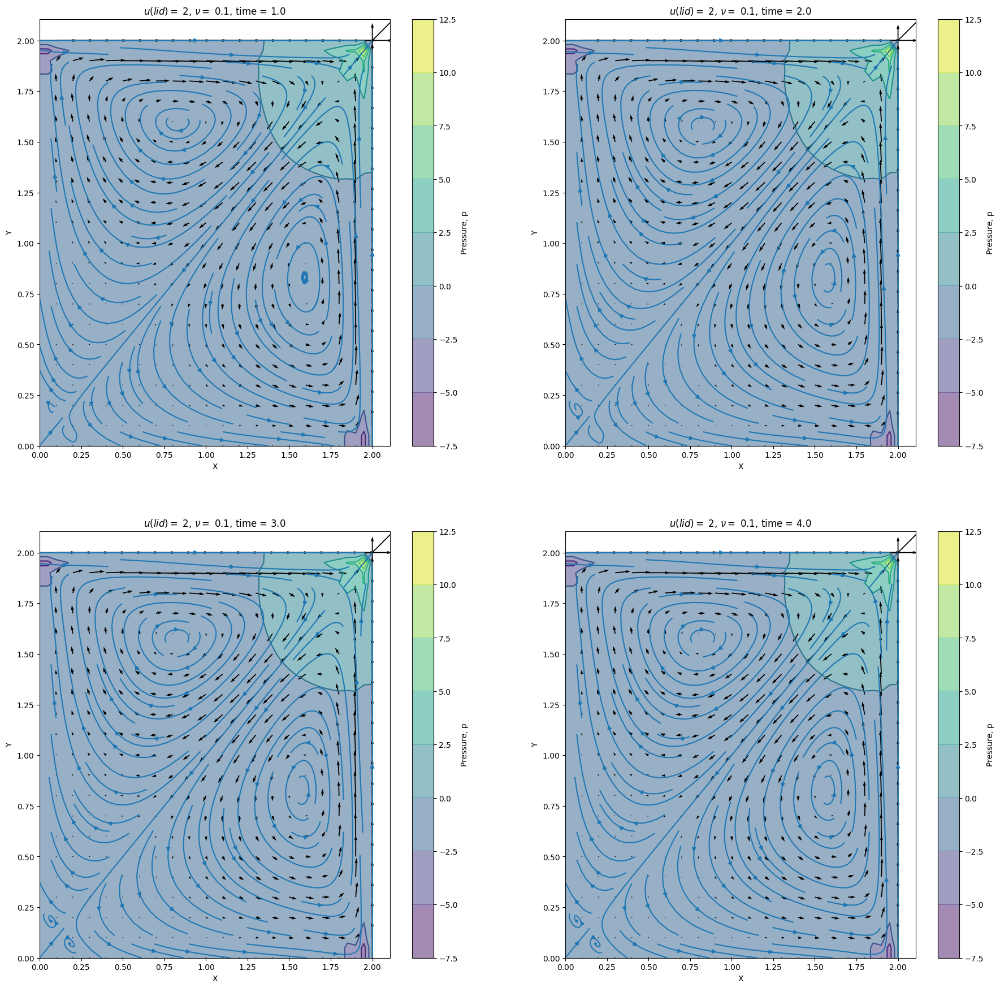

In [28]:
u = np.zeros((ny, nx))
v = np.zeros((ny, nx))
p = np.zeros((ny, nx))

fig = plt.figure(figsize=(22,22), dpi=100)

total_time = 4000
u_lid = 2

for i in range(4):
    nt = int(total_time/4)
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    # plotting the Pressure as a contour
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Pressure, p')
    # plotting the Pressure velocity outlines
    plt.contour(X, Y, p, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt*(i+1)}')
plt.show()

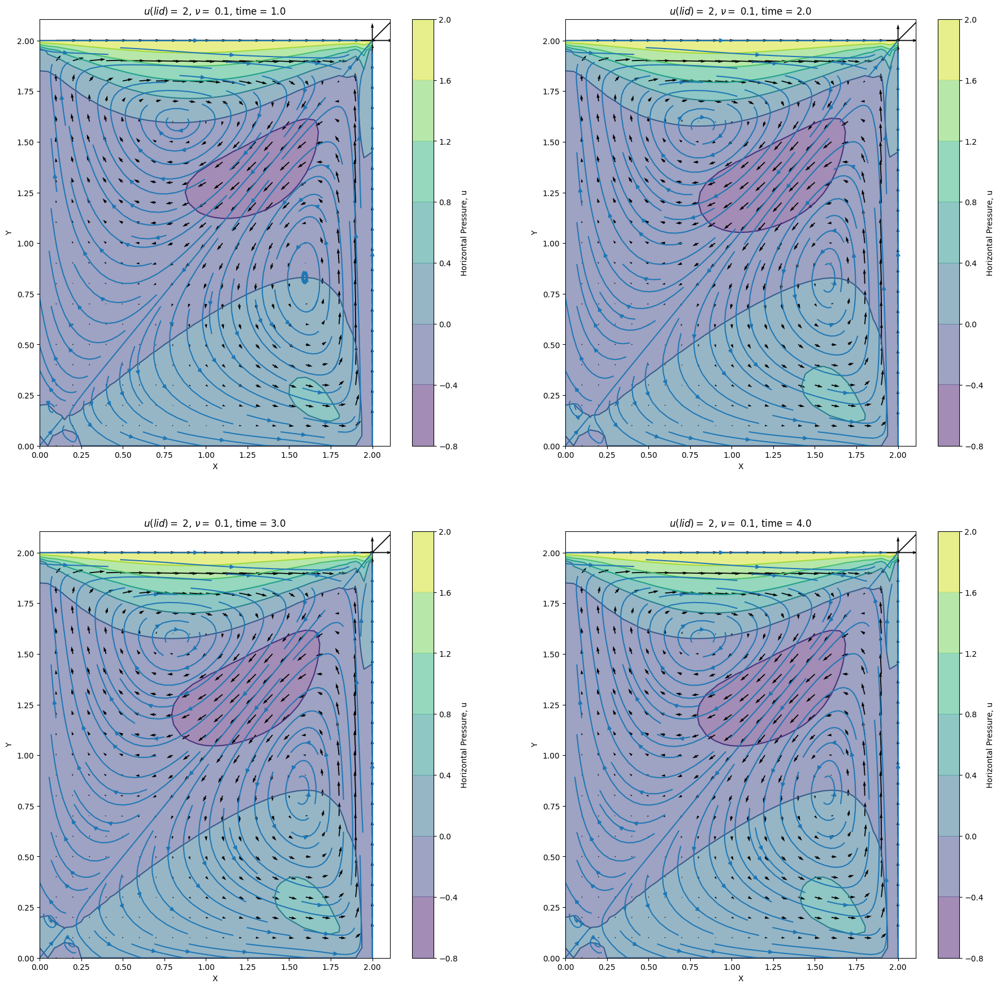

In [30]:
u = np.zeros((ny, nx))
v = np.zeros((ny, nx))
p = np.zeros((ny, nx))

fig = plt.figure(figsize=(22,22), dpi=100)

total_time = 4000
u_lid = 2

for i in range(4):
    nt = int(total_time/4)
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    # plotting the Pressure as a contour
    plt.contourf(X, Y, u, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Horizontal Pressure, u')
    # plotting the Pressure velocity outlines
    plt.contour(X, Y, u, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt*(i+1)}')
plt.show()

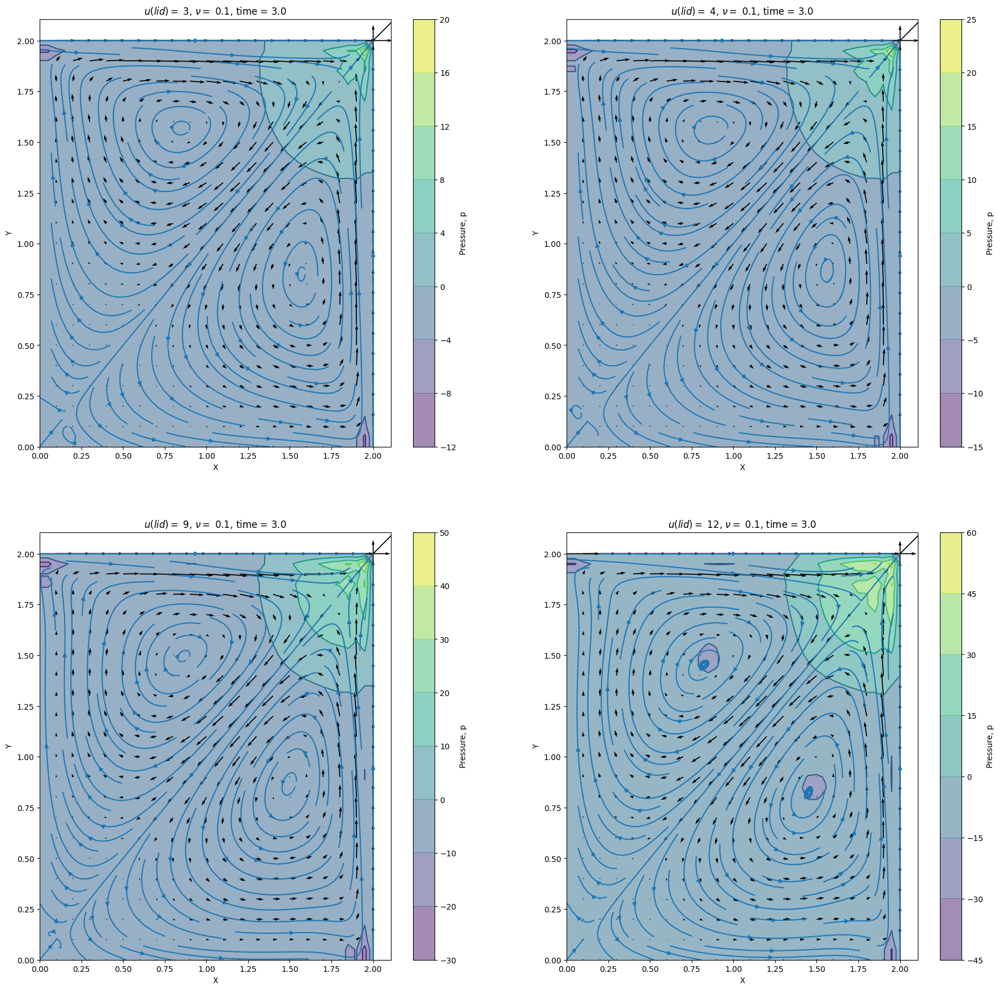

In [29]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [0.5e-1, 1e-1, 1e-2, 0.5e-3]
dt = .001
u_lids = [3,6,9,12]



for i in range(len(u_lids)):
    nu = 0.1
    u_lid = u_lids[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Pressure, p')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, p, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()

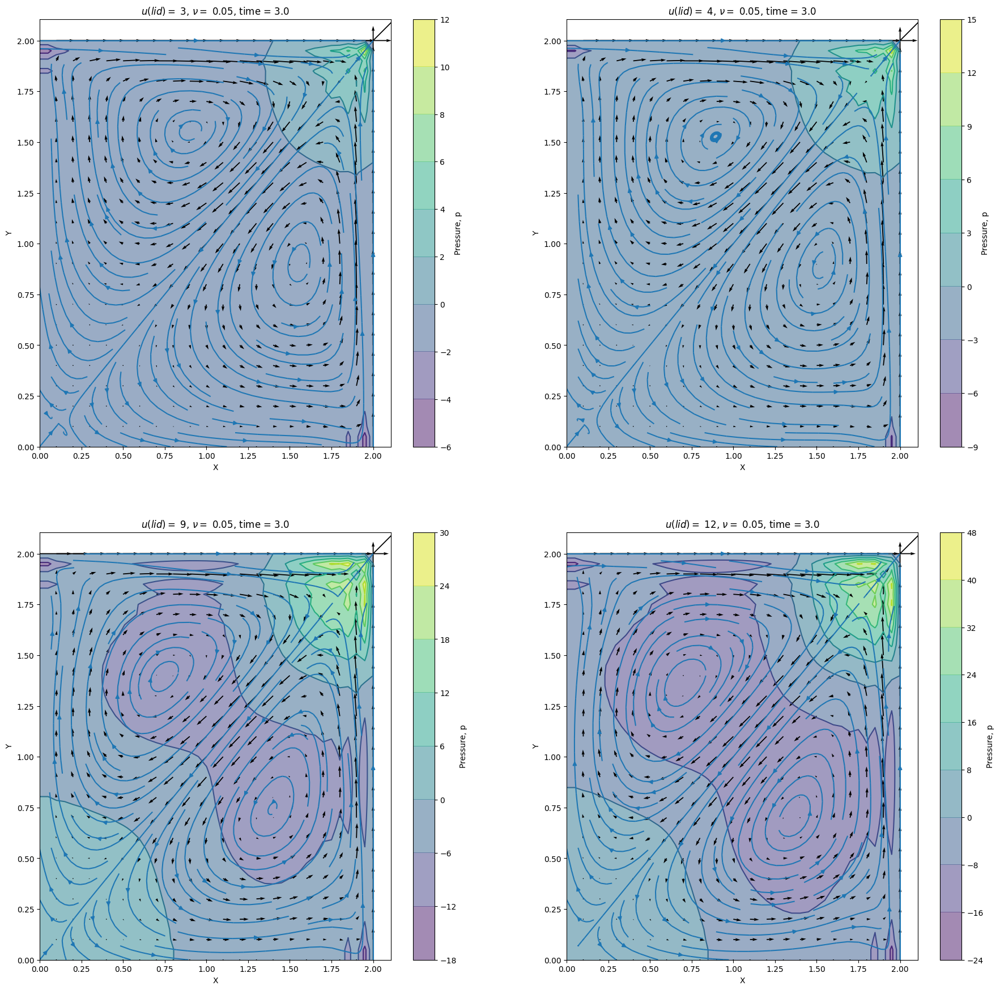

In [31]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [0.5e-1, 1e-1, 1e-2, 0.5e-3]
dt = .001
u_lids = [3,4,9,12]



for i in range(len(u_lids)):
    nu = 0.05
    u_lid = u_lids[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Pressure, p')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, p, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v)  
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()

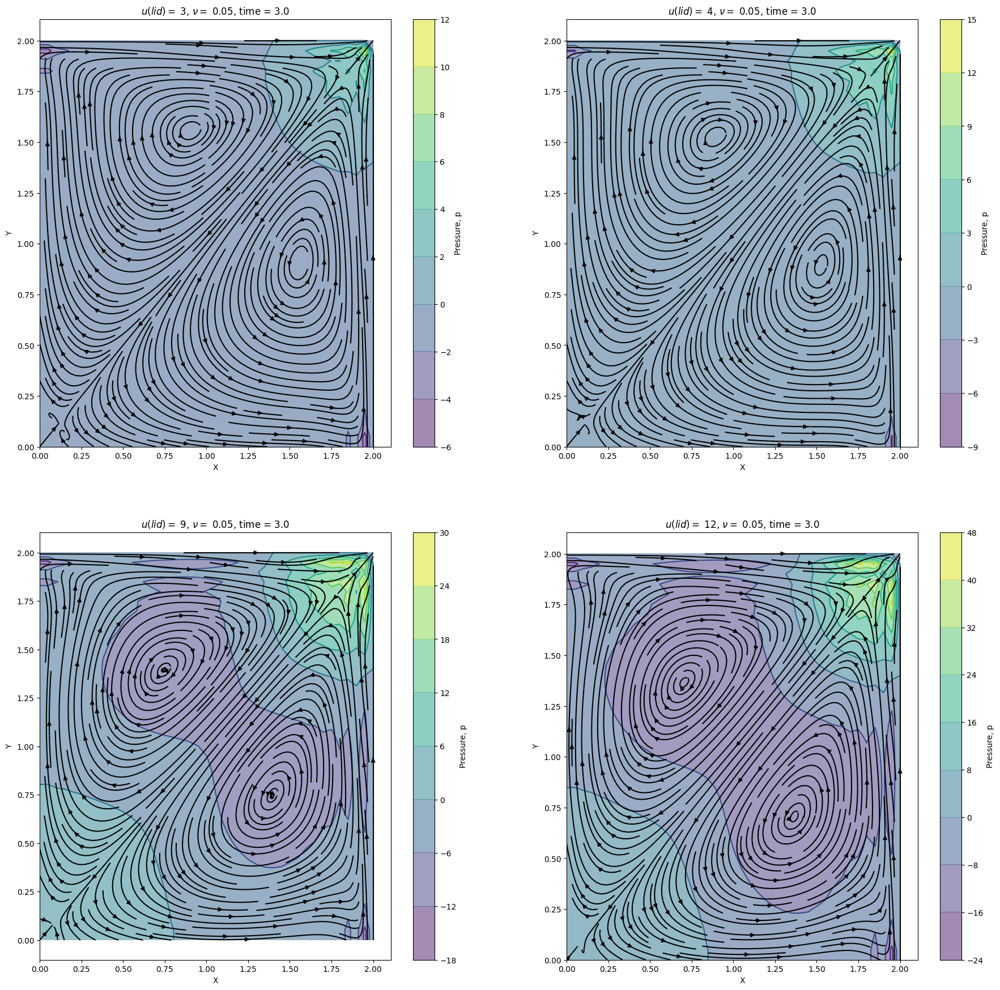

In [32]:
fig = plt.figure(figsize=(22,22), dpi=100)

nus = [0.5e-1, 1e-1, 1e-2, 0.5e-3]
dt = .001
u_lids = [3,4,9,12]



for i in range(len(u_lids)):
    nu = 0.05
    u_lid = u_lids[i]
    u = np.zeros((ny, nx))
    v = np.zeros((ny, nx))
    p = np.zeros((ny, nx))
    nt = 3000
    u, v, p = simulate_cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu, u_lid)

    plt.subplot(2,2,i+1)
    
    # plotting the horizontal velocity as a contour
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar(label = 'Pressure, p')
    # plotting the horizontal velocity outlines
    plt.contour(X, Y, p, cmap=cm.viridis)
    # plotting streamplot
    plt.streamplot(X, Y, u, v, 2, color = 'black')  
    # plotting velocity field
    #plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');
    plt.title(f'$u (lid) =$ {u_lid}, $\\nu =$ {nu}, time = {nt*dt}')
plt.show()